# Making accessible experience with AI

- Computer vision => what is on the image => OCR
- Custom Vision => detecting objects
- Face API => who is on the image
 - Emotions
- Text to Speech => Output to speech
- Speech to Text => Transcribe (Speaker recognition)

-----------------------

### Samples where it all comes together

- Azure Media Services
- Video Indexer
- Seeing AI App




In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random
import numpy as np
from PIL import Image
from io import BytesIO

# Making sense of the world through vision

## Computer vision

In [ ]:
!pip install azure-cognitiveservices-vision-computervision 
!pip install pillow

In [ ]:
az group create -n AZConf_RG -l westeurope
az cognitiveservices account create \
    --name demo-ComputerVision \
    --resource-group AZConf_RG \
    --kind ComputerVision \
    --sku S1 \
    --location westeurope \
    --yes
az cognitiveservices account keys list --name demo-ComputerVision --resource-group AZConf_RG
az cognitiveservices account show --name demo-ComputerVision --resource-group AZConf_RG --query properties.endpoint

In [234]:
from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from azure.cognitiveservices.vision.computervision.models import OperationStatusCodes
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes
from msrest.authentication import CognitiveServicesCredentials

from array import array
import os
from PIL import Image
import sys
import time

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random
import numpy as np
from PIL import Image
from io import BytesIO
from skimage import io

In [14]:
subscription_key = ""
endpoint = "https://westeurope.api.cognitive.microsoft.com/" 
computervision_client = ComputerVisionClient(endpoint, CognitiveServicesCredentials(subscription_key))

In [237]:
remote_image_url = "https://www.hotelamsterdamcentre.com/wp-content/uploads/2018/08/damrak_marco_n%C3%BCrnberger-740x494.jpg"
remote_image_url = "https://www.roselinde.me/wp-content/uploads/2018/07/FF4BB0D9-C18F-44EE-93B3-E5E492B58D10.jpg"


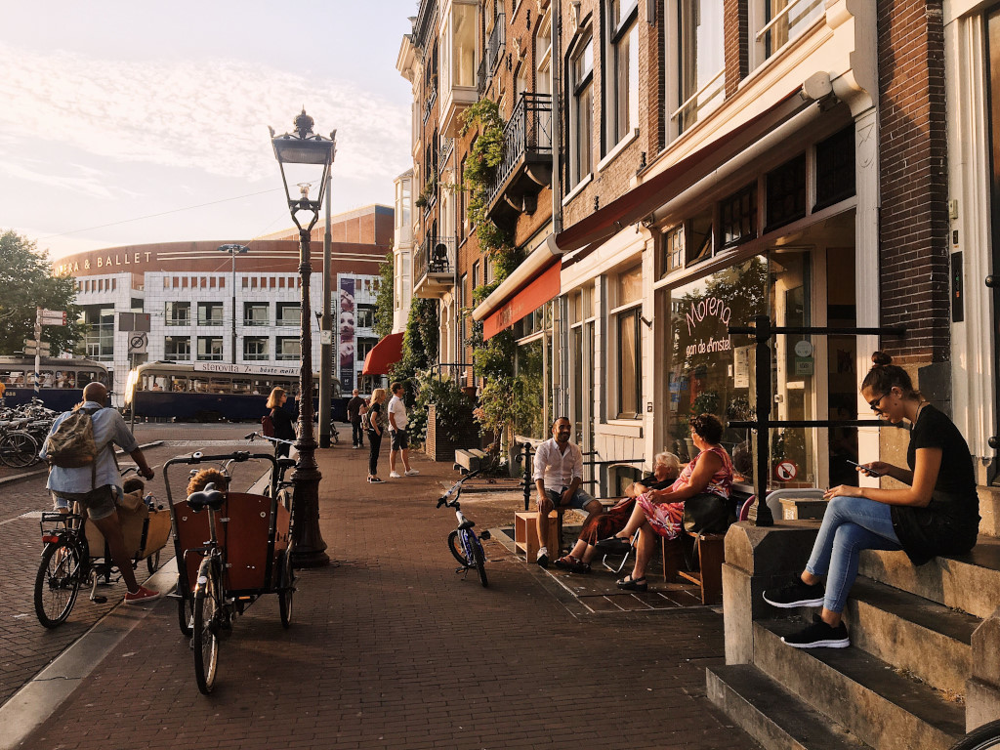

In [238]:
from IPython.display import Image 
pil_img = Image(remote_image_url)
display(pil_img)

In [253]:
description_results = computervision_client.describe_image(remote_image_url)

for description in description_results.captions:
    print(description.text, "| Confidence: ","%.2f" % description.confidence)

Mark Rutte, Stef Blok are posing for a picture | Confidence:  0.45


In [240]:
# Detect objects in the Images
detect_objects_results_remote = computervision_client.detect_objects(remote_image_url)

i = io.imread(remote_image_url)
im = plt.imread(i)

# Create figure and axes
fig = plt.figure(figsize = (im.shape[1]/100, im.shape[0]/100))
ax = plt.axes((0,0,1,1))

# Display the image
ax.imshow(im,origin='upper')

# Overlay the information
for object in detect_objects_results_remote.objects:
    color = (np.random.rand(),np.random.rand(),np.random.rand())
    rect = patches.Rectangle((object.rectangle.x, object.rectangle.y), 
                             object.rectangle.w, object.rectangle.h, linewidth=2, edgecolor=color, facecolor='none')
    ax.add_patch(rect)
   
    ax.text(
        (1/im.shape[1]*object.rectangle.x), 1-(1/im.shape[0]*object.rectangle.y), object.object_property,
        horizontalalignment='left',
        verticalalignment='bottom',
        fontsize=16,
        color='w',
        backgroundcolor=color,
        transform=ax.transAxes
    )
ax.axis('off')
plt.show()

AttributeError: 'numpy.ndarray' object has no attribute 'read'

In [252]:
remote_image_url = "https://i.pinimg.com/originals/73/16/06/731606612b068ea7c2f9447092271b77.jpg"
# Select the visual feature(s) you want.
remote_image_features = ["faces"]
# Call the API with remote URL and features
detect_faces_results_remote = computervision_client.analyze_image(remote_image_url, remote_image_features)

# Print the results with gender, age, and bounding box
print("Faces in the remote image: ")
if (len(detect_faces_results_remote.faces) == 0):
    print("No faces detected.")
else:
    for face in detect_faces_results_remote.faces:
        print("'{}' of age {} at location {}, {}, {}, {}".format(face.gender, face.age, \
        face.face_rectangle.left, face.face_rectangle.top, \
        face.face_rectangle.left + face.face_rectangle.width, \
        face.face_rectangle.top + face.face_rectangle.height))

Faces in the remote image: 
'Male' of age 49 at location 1827, 386, 2051, 610
'Male' of age 48 at location 496, 271, 712, 487


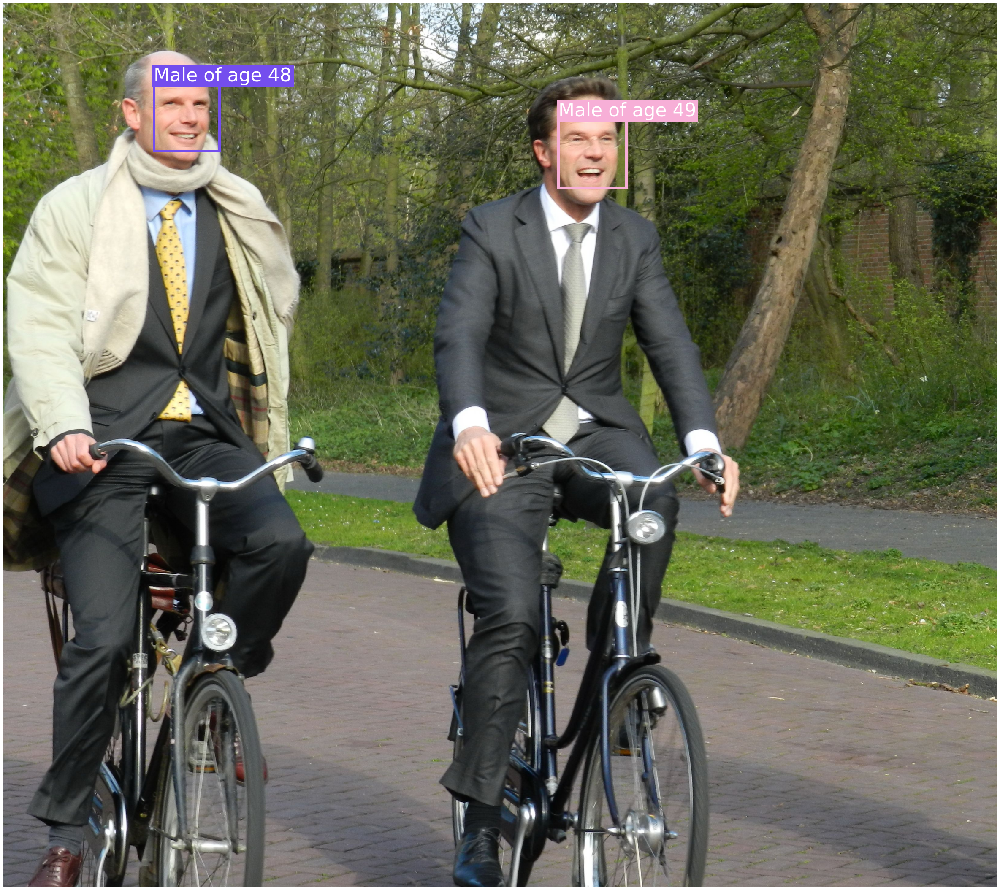

In [250]:
im = plt.imread("../accessibility-ai/images/prime-minister.jpg")

# Create figure and axes
fig = plt.figure(figsize = (im.shape[1]/100, im.shape[0]/100))
ax = plt.axes((0,0,1,1))

# Display the image
ax.imshow(im,origin='upper')

# Overlay the information
for face in detect_faces_results_remote.faces:
    color = (np.random.rand(),np.random.rand(),np.random.rand())
    rect = patches.Rectangle((face.face_rectangle.left, face.face_rectangle.top), 
                             face.face_rectangle.width, face.face_rectangle.height, linewidth=6, edgecolor=color, facecolor='none')
    ax.add_patch(rect)
   
    ax.text(
        (1/im.shape[1]*face.face_rectangle.left), 1-(1/im.shape[0]*face.face_rectangle.top), 
        "{} of age {}".format(face.gender,face.age),
        horizontalalignment='left',
        verticalalignment='bottom',
        fontsize=44,
        color='w',
        backgroundcolor=color,
        transform=ax.transAxes
    )
ax.axis('off')
plt.show()

In [256]:
detect_domain_results_celebs_remote = computervision_client.analyze_image_by_domain("celebrities", remote_image_url)

# Print detection results with name
print("Celebrities in the image:")
if len(detect_domain_results_celebs_remote.result["celebrities"]) == 0:
    print("No celebrities detected.")
else:
    for celeb in detect_domain_results_celebs_remote.result["celebrities"]:
        print(celeb)

Celebrities in the image:
{'name': 'Mark Rutte', 'confidence': 0.9999858140945435, 'faceRectangle': {'left': 1818, 'top': 381, 'width': 226, 'height': 226}}
{'name': 'Stef Blok', 'confidence': 0.9999761581420898, 'faceRectangle': {'left': 490, 'top': 267, 'width': 215, 'height': 215}}


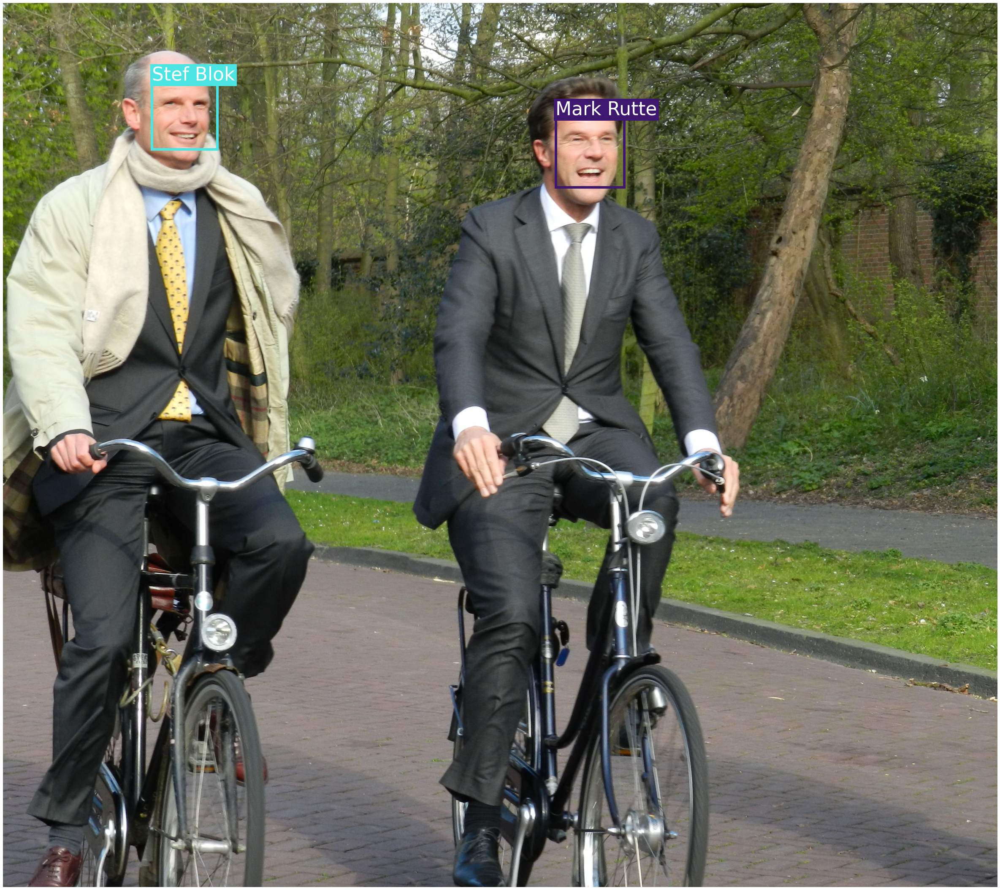

In [267]:
im = plt.imread("../accessibility-ai/images/prime-minister.jpg")

# Create figure and axes
fig = plt.figure(figsize = (im.shape[1]/100, im.shape[0]/100))
ax = plt.axes((0,0,1,1))

# Display the image
ax.imshow(im,origin='upper')

# Overlay the information
for face in detect_domain_results_celebs_remote.result["celebrities"]:
    color = (np.random.rand(),np.random.rand(),np.random.rand())
    rect = patches.Rectangle((face['faceRectangle']['left'], face['faceRectangle']['top']), 
                             face['faceRectangle']['width'], face['faceRectangle']['height'], linewidth=6, edgecolor=color, facecolor='none')
    ax.add_patch(rect)
   
    ax.text(
        (1/im.shape[1]*face['faceRectangle']['left']), 1-(1/im.shape[0]*face['faceRectangle']['top']), 
        "{}".format(face['name']),
        horizontalalignment='left',
        verticalalignment='bottom',
        fontsize=44,
        color='w',
        backgroundcolor=color,
        transform=ax.transAxes
    )
ax.axis('off')
plt.show()

## Read text in images

In [292]:
print("===== Start =====")
# Get an image with text
read_image_url = "https://www.fearlessmotivation.com/wp-content/uploads/2018/03/CHALIE-CHAPLIN-SPEECH.jpg"
#read_image_url = "https://m.media-amazon.com/images/I/51kiTXHuzqL._AC_.jpg"

# Call API with URL and raw response (allows you to get the operation location)
read_response = computervision_client.read(read_image_url,  raw=True)

read_operation_location = read_response.headers["Operation-Location"]
# Grab the ID from the URL
operation_id = read_operation_location.split("/")[-1]

# Call the "GET" API and wait for it to retrieve the results 
while True:
    read_result = computervision_client.get_read_result(operation_id)
    if read_result.status not in ['notStarted', 'running']:
        break
    time.sleep(1)

print("===== Done =====")

===== Start =====
===== Done =====


More than machinery
we need humanity.
More than cleverness
we need kindness
and gentleness,
CHARLIE CHAPLIN
FEARLESSMOTIVATION. COM


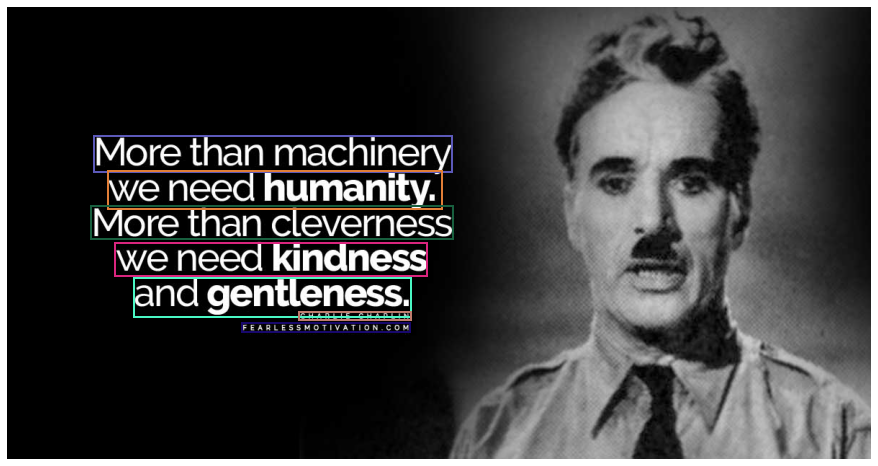

In [293]:
im = plt.imread("../accessibility-ai/images/charly.jpg")

# Create figure and axes
fig = plt.figure(figsize = (im.shape[1]/100, im.shape[0]/100))
ax = plt.axes((0,0,1,1))

# Display the image
ax.imshow(im,origin='upper')

for text_result in read_result.analyze_result.read_results:
    for line in text_result.lines:
        color = (np.random.rand(),np.random.rand(),np.random.rand())
        rect = patches.Rectangle((line.bounding_box[0], line.bounding_box[1]), 
                             line.bounding_box[2]-line.bounding_box[0], line.bounding_box[7]-line.bounding_box[1], linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        print(line.text)
    
ax.axis('off')
plt.show()

In [294]:
print("===== Start =====")
# Get an image with text
read_image_url = "https://raw.githubusercontent.com/hnky/accessibility-ai/main/images/charly-hand.jpg"
#read_image_url = "https://m.media-amazon.com/images/I/51kiTXHuzqL._AC_.jpg"

# Call API with URL and raw response (allows you to get the operation location)
read_response = computervision_client.read(read_image_url,  raw=True)

read_operation_location = read_response.headers["Operation-Location"]
# Grab the ID from the URL
operation_id = read_operation_location.split("/")[-1]

# Call the "GET" API and wait for it to retrieve the results 
while True:
    read_result = computervision_client.get_read_result(operation_id)
    if read_result.status not in ['notStarted', 'running']:
        break
    time.sleep(1)

print("===== Done =====")

===== Start =====
===== Done =====


More than machinery
we need humanity
More than cleverness
we need kindness
and gentleness


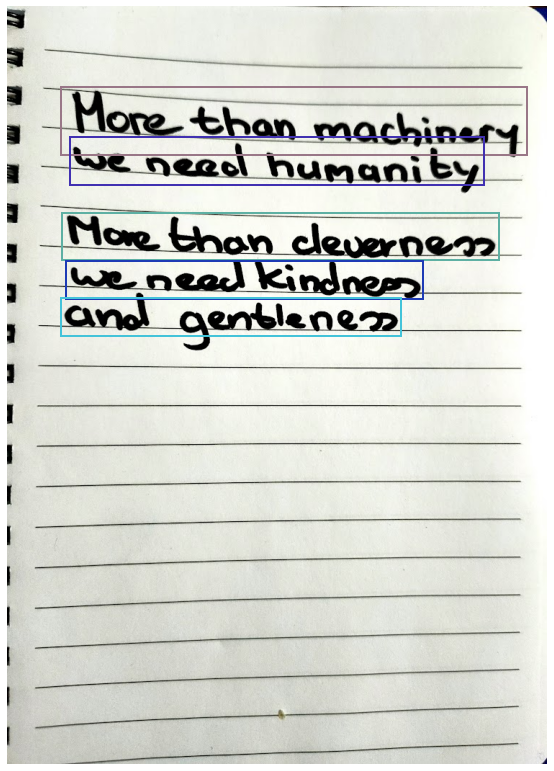

In [298]:
im = plt.imread("../accessibility-ai/images/charly-hand.jpg")

# Create figure and axes
fig = plt.figure(figsize = (im.shape[1]/100, im.shape[0]/100))
ax = plt.axes((0,0,1,1))

# Display the image
ax.imshow(im,origin='upper')

for text_result in read_result.analyze_result.read_results:
    for line in text_result.lines:
        color = (np.random.rand(),np.random.rand(),np.random.rand())
        rect = patches.Rectangle((line.bounding_box[0], line.bounding_box[1]), 
                             line.bounding_box[2]-line.bounding_box[0], line.bounding_box[5]-line.bounding_box[1], linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        print(line.text)
    
ax.axis('off')
plt.show()

# Making sense of the world through speech